# Exploratory Data Analysis

Here we will look at recent sales data and try to get a feel for what we have. 

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
sns.set()
%matplotlib inline

In [2]:
X = pd.read_csv('data/clean_data.csv')

In [3]:
X['Property Type'].unique()

array(['SFR', 'DUP_TRI', 'TWNHM', 'RCON'], dtype=object)

In [4]:
single_family = X[X['Property Type']=='SFR']
print(single_family.shape)

townhomes = X[X['Property Type']=='TWNHM']
print(townhomes.shape)

condos = X[X['Property Type']=='RCON']
print(condos.shape)

duplex = X[X['Property Type']=='DUP_TRI']
print( duplex.shape)

(18672, 23)
(2641, 23)
(5249, 23)
(275, 23)


## Part 1. Univariate analysis
In thins part we will explore the distribution of each variable in the dataset. Plot histograms, box plots, or density plots to understand the range, central tendency, and skewness of the data.

#### 'Location' variable.

In [5]:
X['Location'].value_counts()

LONGMONT          9827
BOULDER           7001
LAFAYETTE         3016
ERIE              2182
LOUISVILLE        1771
UNINCORPORATED    1748
SUPERIOR          1265
LYONS               24
NEDERLAND            3
Name: Location, dtype: int64

Most of Boulder county housing sales in the period are in Longmont, followed by Boulder, Lafayette, Erie, Louisville, Unincorporated and Superior. 

The only new information we're learning from 'Location' that is not already in a 'Market Area' is whether the location is unincorporated or not. So we can preserve the additional information with a binary variable. We will call new binary variable 'Unincorporated', where if  Unincorporated = 1, otherwise 0. 

In [6]:
X['Unincorporated']= 0
X.loc[X['Location']=='UNINCORPORATED', 'Unincorporated']=1
X['Unincorporated'].sum()

1748

#### 'Design' variable

In [7]:
X['Design'].value_counts()

Multi Sty                9826
Ranch                    6251
1 Sty Condo              2976
Multi Sty Townh          2445
Split level              1724
Multi Sty Condo          1042
Mutli Sty Twnhm Condo     972
Bi Level                  672
Paired                    283
1-Sty Twnhm Condo         216
1 Sty Townh               196
Patio                     182
Det Mult Sty Condo         36
Modular                     9
Det 1 Sty Condo             7
Name: Design, dtype: int64

In [8]:
X['Design_orig']= X['Design']

In [9]:
townhomes['Design'].unique()
fig = px.histogram(townhomes, x="Design",title ='Townhome designs')
fig.show()

condos['Design'].unique()
fig = px.histogram(condos, x="Design", title ='Condo designs')
fig.show()

single_family['Design'].unique()
fig = px.histogram(single_family, x="Design", title ='Single family designs')

fig.show()

In [10]:
# Loop through the list and replace values containing 'condo' with 'condo'
for i in range(len(X['Design'])):
    if 'Condo' in X['Design'][i]:
        X['Design'][i] = 'Condo'

# Print the updated list
print(X['Design'])



/var/folders/93/rlhghy792jqb_shw4fl2xbn80000gn/T/ipykernel_35603/1781143222.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



0              Ranch
1              Ranch
2              Ranch
3        Split level
4        Split level
            ...     
26832          Condo
26833          Condo
26834          Condo
26835          Condo
26836          Condo
Name: Design, Length: 26837, dtype: object


We merged condo designs to not have too many dummy variables.

In [11]:
X['Design'].unique()

array(['Ranch', 'Split level', 'Bi Level', 'Multi Sty', 'Paired',
       '1 Sty Townh', 'Modular', 'Multi Sty Townh', 'Patio', 'Condo'],
      dtype=object)

In [12]:
X['Design_orig']= X['Design']

So for Design there is no obvious natural progression, so we prefer to one hot encode the variables and perhaps drop one category. 

In [13]:
X.columns

Index(['Accout Number', 'Property Type', 'Property Address Street Number',
       'Property Address Street Dir', 'Property Address Street Name',
       'Property Address Street Suffix', 'Property Address Unit Number',
       'Location', 'Design', 'Quality', 'Eff Yr Built', 'Above Grd SF',
       'Basemt Tot SF', 'Basemt Fin SF', 'Basemt Unf SF', 'Garage Type',
       'Garage SF', 'Est Land SF', 'Reception No', 'Sale Date (Mon-Yr)',
       'Sale Price', 'Time Adjust Sales Price', 'Market Area',
       'Unincorporated', 'Design_orig'],
      dtype='object')

In [14]:
X = pd.get_dummies(X, columns=['Design_orig'], prefix='Design')

In [15]:
sum(X['Design']=='Ranch')

6251

In [16]:
data = [sum(X['Design']=='Ranch'), sum(X['Design']=='Split level'),sum(X['Design']=='Bi Level'),sum(X['Design']=='Multi Sty'),
       sum(X['Design']=='Paired'),sum(X['Design']=='1 Sty Townh'),sum(X['Design']=='Modular')]
keys = ['Ranch', 'Split level', 'Bi Level', 'Multi Sty', 'Paired',
       '1 Sty Townh', 'Modular']
  
fig = px.pie(X, values=data, names=keys, title='Single family home designs')
fig.show()

In [17]:
fig = px.histogram(X, x="Design")
fig.show()

#### 'Quality' variable
So for quality there is a natural progression from Fair to Average to Good to Excellent. It seems that the assumption of equal distance between the quality levels is correct. So we recode it as a single variable

In [18]:
X['Quality'].unique()

array(['Avg ++', 'Avg', 'Avg +', 'Good ++', 'Good', 'V Good', 'Good +',
       'V Good +', 'V Good++', 'Excel', 'Excel+', 'Fair', 'Excel++',
       'Excep', 'Excep+'], dtype=object)

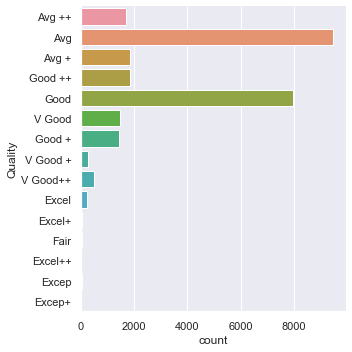

In [19]:
sns.catplot(y='Quality', data=X, kind='count')
plt.show()

In [20]:
# Create the Quality_cat column filled with zeros
X['Quality_cat'] = 0

X.loc[X['Quality']=='Avg', 'Quality_cat'] = 1
X.loc[X['Quality']=='Avg +', 'Quality_cat'] = 2
X.loc[X['Quality']=='Avg ++', 'Quality_cat'] = 3
X.loc[X['Quality']=='Good', 'Quality_cat'] = 4
X.loc[X['Quality']=='Good +', 'Quality_cat'] = 5
X.loc[X['Quality']=='Good ++', 'Quality_cat'] = 6
X.loc[X['Quality']=='V Good', 'Quality_cat'] = 7
X.loc[X['Quality']=='V Good +', 'Quality_cat'] = 8
X.loc[X['Quality']=='V Good++', 'Quality_cat'] = 9
X.loc[X['Quality']=='Excel', 'Quality_cat'] = 10
X.loc[X['Quality']=='Excel+', 'Quality_cat'] = 11
X.loc[X['Quality']=='Excel++', 'Quality_cat'] = 12
X.loc[X['Quality']=='Excep', 'Quality_cat'] = 13
X.loc[X['Quality']=='Excep+', 'Quality_cat'] = 14

In [23]:
fig = px.histogram(X, x="Quality", title ='Property quality rating')
fig.show()

Most properties receive 'Good' and 'Average' ratings, so such detailed breakdown with + and ++ seems useless. Also Excelllent and Exceptional are such rare things, perhaps they help distinguish high value property. 

#### 'Garage Type' variable

In [24]:
X['Garage Type'].unique()

array(['Attached', 'Carport', 'Detached', 'None', 'Multiple', 'Basement',
       'Workshop'], dtype=object)

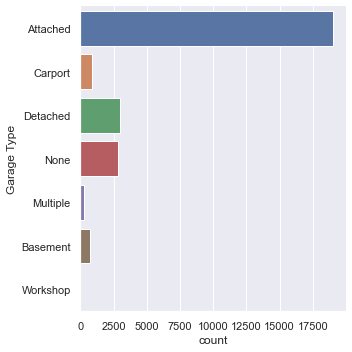

In [25]:
sns.catplot(y='Garage Type', data=X, kind='count')
plt.show()

We binarize the Attached vs all other. For garage we will binarize to two categories 'attached' and 'other' since there are not many observations in other categories except attached. We create a new variable 'Garage Attached'

In [26]:
X['Garage Attached'] = 0
X.loc[X['Garage Type']=='Attached', 'Garage Attached'] = 1
X['Garage Attached'].sum()

19019

### 'Market Area' variable

In [27]:
X['Market Area Num'] = X['Market Area']

In [28]:
X = pd.get_dummies(X, columns=['Market Area Num'], prefix='Market Area')

### 'Above Grd SF' variable. 
We are interested in the distribution of square footage of single family homes.

In [31]:
X['Above Grd SF'].describe()

count    26837.000000
mean      1760.957223
std        817.450241
min        278.000000
25%       1136.000000
50%       1584.000000
75%       2211.000000
max       7659.000000
Name: Above Grd SF, dtype: float64

Text(0.5, 1.0, 'Basement SF and Above ground SF distribution')

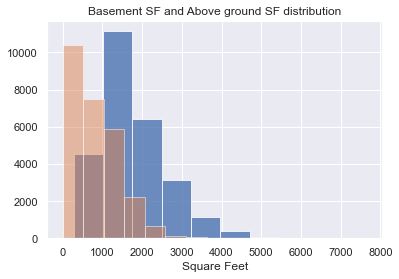

In [32]:
fig, ax = plt.subplots()
ax.hist(X['Above Grd SF'], alpha=0.8)
ax.hist(X['Basemt Tot SF'], alpha=0.5)
ax.set_xlabel('Square Feet')
ax.set_title ('Basement SF and Above ground SF distribution')


In [34]:
fig2 = px.box(X, y=["Above Grd SF"], width=400, height=300)
fig2.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig2.show()

In [35]:
fig = px.box(X, y=["Basemt Tot SF"], width=400, height=300)
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

### 'Time adjusted sale price' variable

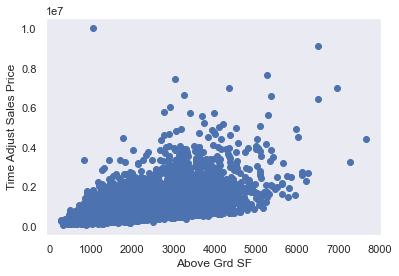

In [36]:
# Scatter plot
fig, ax = plt.subplots()
ax.scatter(X['Above Grd SF'], X['Time Adjust Sales Price'])

# x-axis label
ax.set_xlabel('Above Grd SF')

# y-axis label
ax.set_ylabel('Time Adjust Sales Price')
plt.grid()
plt.show()


We clearly have at least one outlier that will make our work much harder. Let's identify them and drop them. 

In [37]:
X['Est Land SF'].sort_values(ascending=False)

4845     2937251.0
15686    1295126.0
13665     653400.0
4846      490486.0
18629     348480.0
           ...    
23337          0.0
23336          0.0
23335          0.0
23334          0.0
26836          0.0
Name: Est Land SF, Length: 26837, dtype: float64

In [38]:
X.drop([4845, 4846,15686,13665], inplace= True)

Now let's check the data visually again by plotting the scatterplot of Sales price vs Square footage

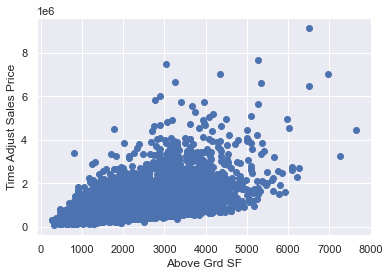

In [39]:
# Scatter plot
fig, ax = plt.subplots()
ax.scatter(X['Above Grd SF'], X['Time Adjust Sales Price'])

# x-axis label
ax.set_xlabel('Above Grd SF')

# y-axis label
ax.set_ylabel('Time Adjust Sales Price')
plt.show()

This doesn't look bad.

### 'Est Land SF' variable 
Now let's look at land SF

In [40]:
print(X['Est Land SF'].describe())

fig = px.histogram(X, x="Est Land SF", title ='Land area')
fig.show()



count     26833.000000
mean       6441.658465
std        8116.784734
min           0.000000
25%        1625.000000
50%        6376.000000
75%        8264.000000
max      348480.000000
Name: Est Land SF, dtype: float64


In [42]:
X['Est Land SF'].sort_values(ascending=False)
X[X['Est Land SF']==348480]

,Accout Number,Property Type,Property Address Street Number,Property Address Street Dir,Property Address Street Name,Property Address Street Suffix,Property Address Unit Number,Location,Design,Quality,...,Market Area_501,Market Area_502,Market Area_503,Market Area_505,Market Area_506,Market Area_507,Market Area_630,Market Area_632,Market Area_633,Market Area_634
18629,R0060564,SFR,11552,NaN,UTE,RD,NaN,LONGMONT,Ranch,Fair,...,0,0,0,0,0,1,0,0,0,0


In [43]:
fig = px.scatter(X, y="Est Land SF", title ='Land area')
fig.show()

This doesn't look bad, there are only a few large properties and we already double checked the top point - 11 acre lot. 

## Bivariate Analysis
Here we explore the relationship between pairs of variables. Scatter plots, line plots, and bar charts are useful to visualize the correlation between different variables. You can also use correlation matrices and heatmaps to calculate and visualize the correlation coefficient between different variables.

Let's look at sales price by the market area. 

In [44]:
X['Market Area'].unique()

array([401, 402, 403, 404, 405, 101, 102, 103, 104, 105, 106, 107, 501,
       502, 503, 505, 507, 108, 109, 407, 506, 630, 632, 633, 634])

In [45]:
X[X['Market Area']==101]['Market Area Name']="Chataqua"
X[X['Market Area']==103]['Market Area Name']="Broadway West"
X[X['Market Area']==102]['Market Area Name']="Pearl Street"
X[X['Market Area']==107]['Market Area Name']="Downtown"
X[X['Market Area']==105]['Market Area Name']="East Boulder"
X[X['Market Area']==104]['Market Area Name']="South Boulder"
X[X['Market Area']==106]['Market Area Name']="Table Mesa South"



X[X['Market Area']==201]['Market Area Name']="Deep Mountains"
X[X['Market Area']==202]['Market Area Name']="Mountains"


X[X['Market Area']==301]['Market Area Name']="East of Boulder"
X[X['Market Area']==302]['Market Area Name']="North of Boulder"
X[X['Market Area']==303]['Market Area Name']="Erie to Longmont"

X[X['Market Area']==401]['Market Area Name']="Gunbarrel"
X[X['Market Area']==402]['Market Area Name']="Superior"
X[X['Market Area']==403]['Market Area Name']="Louisville"
X[X['Market Area']==404]['Market Area Name']="Erie"
X[X['Market Area']==405]['Market Area Name']="Lafayette"


X[X['Market Area']==501]['Market Area Name']="Niwot"
X[X['Market Area']==502]['Market Area Name']="Central Longmont"
X[X['Market Area']==503]['Market Area Name']="South Longmont"

X[X['Market Area']==505]['Market Area Name']="287 Longmont"
X[X['Market Area']==505]['Market Area Name']="East Longmont"

/var/folders/93/rlhghy792jqb_shw4fl2xbn80000gn/T/ipykernel_35603/571741431.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/93/rlhghy792jqb_shw4fl2xbn80000gn/T/ipykernel_35603/571741431.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/93/rlhghy792jqb_shw4fl2xbn80000gn/T/ipykernel_35603/571741431.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

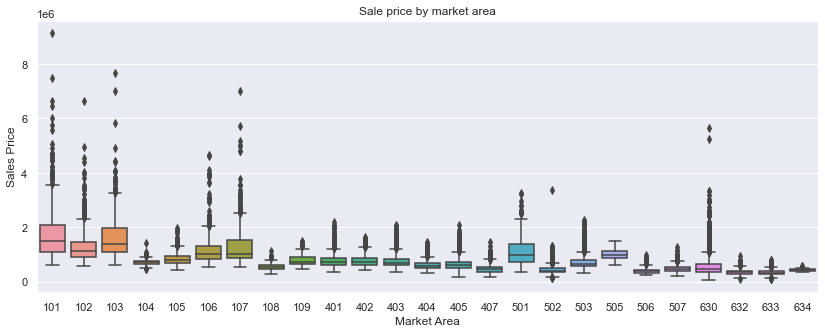

In [47]:
_ = sns.boxplot(x='Market Area', y='Time Adjust Sales Price', data=X)
_ = plt.xlabel('Market Area')
_ = plt.ylabel('Sales Price')
_= plt.title('Sale price by market area')
_= sns.set(rc={'figure.figsize':(14,5)})
plt.show()

Boulder market areas(101-107) seem a bit more expensive on average compared to suburbs (401-405). 
There is also spike in Niwot (501) Let's break up this graph into such areas.

In [48]:
# subset the dataframe based on a range of values in the quant_var column
erielafayette = X.loc[(X['Market Area'] >= 400) & (X['Market Area'] <= 406)]
boulder = X.loc[(X['Market Area'] >= 100) & (X['Market Area'] < 108)]
county = X.loc[X['Market Area'].isin([201,202,301,302,302,304])]
longmont = X.loc[X['Market Area'].isin([501, 502, 503, 505, 507])]
townhomes =  X.loc[X['Market Area'].isin([108, 109, 407, 506])]
condos = X.loc[(X['Market Area'] >= 600) & (X['Market Area'] <= 700)]

In [49]:
print(boulder.shape, erielafayette.shape,longmont.shape, townhomes.shape, condos.shape, county.shape)

(3624, 61) (7078, 61) (8290, 61) (2592, 61) (5249, 61) (0, 61)


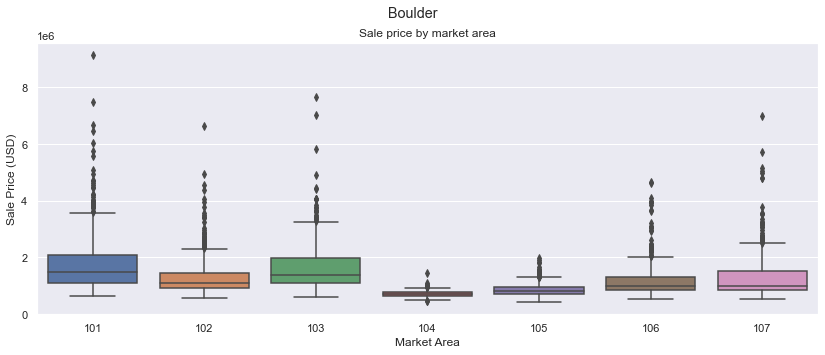

In [50]:
_ = sns.boxplot(x='Market Area', y='Time Adjust Sales Price', data=boulder)
_ = plt.xlabel('Market Area')
_ = plt.ylabel('Sale Price (USD)')
_= plt.title('Sale price by market area')
_= plt.suptitle('Boulder ')

plt.show()

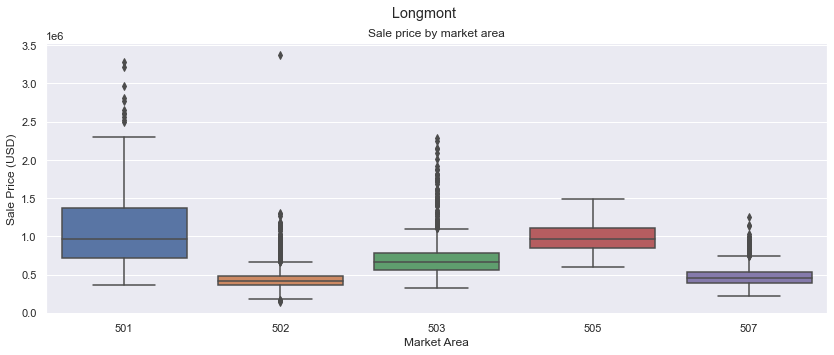

In [51]:
_ = sns.boxplot(x='Market Area', y='Time Adjust Sales Price', data=longmont)
_ = plt.xlabel('Market Area')
_ = plt.ylabel('Sale Price (USD)')
_= plt.title('Sale price by market area')
_= plt.suptitle('Longmont')

plt.show()

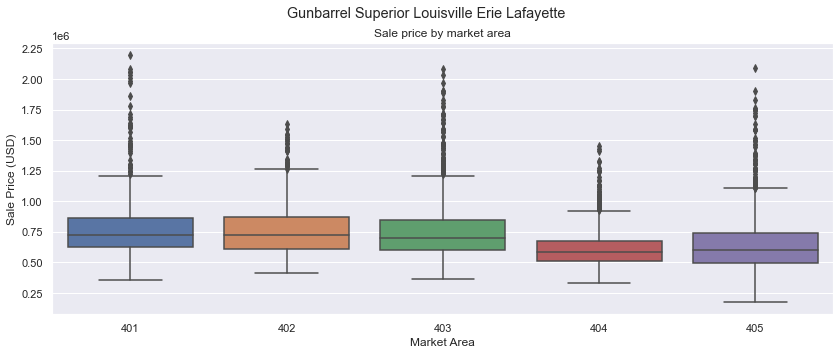

In [52]:
_ = sns.boxplot(x='Market Area', y='Time Adjust Sales Price', data=erielafayette)
_ = plt.xlabel('Market Area')
_ = plt.ylabel('Sale Price (USD)')
_= plt.title('Sale price by market area')
_= plt.suptitle('Gunbarrel Superior Louisville Erie Lafayette  ')

plt.show()

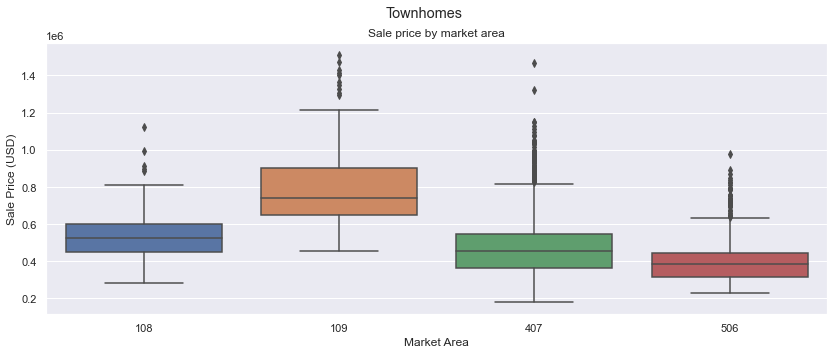

In [53]:
_ = sns.boxplot(x='Market Area', y='Time Adjust Sales Price', data=townhomes)
_ = plt.xlabel('Market Area')
_ = plt.ylabel('Sale Price (USD)')
_= plt.title('Sale price by market area')
_= plt.suptitle('Townhomes')

plt.show()

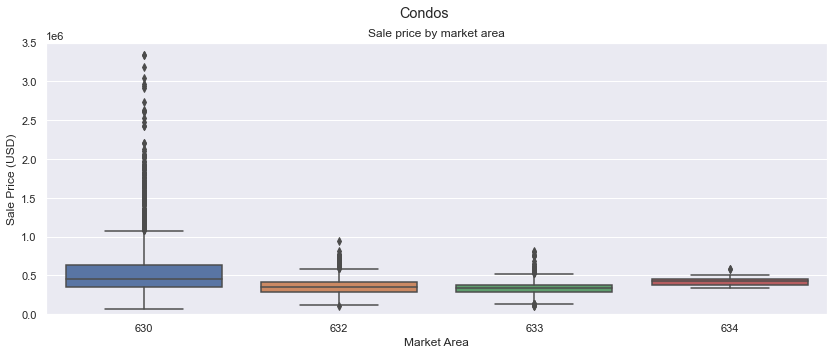

In [61]:
_ = sns.boxplot(x='Market Area', y='Time Adjust Sales Price', data=condos)
_ = plt.xlabel('Market Area')
_ = plt.ylabel('Sale Price (USD)')
_= plt.title('Sale price by market area')
_= plt.suptitle('Condos')
_= plt.ylim(0, 3500000)

plt.show()

In [62]:
import plotly.express as px
fig = px.box(single_family, x='Location', y='Time Adjust Sales Price', title ='Single family home prices by location')
fig.show()

In [64]:
fig = px.box(condos, x='Location', y='Time Adjust Sales Price', title ='Condo prices by location')
fig.update_layout(yaxis_range=[0, 3500000])
fig.show()

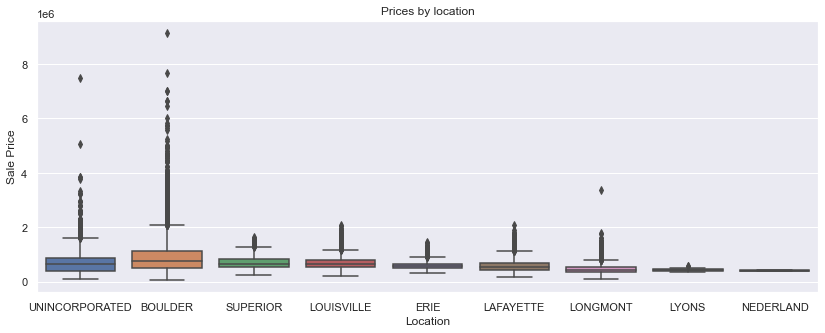

In [65]:
_ = sns.boxplot(x='Location', y='Time Adjust Sales Price', data=X)
_ = plt.xlabel('Location')
_ = plt.ylabel('Sale Price')
_= plt.title('Prices by location')
plt.show()

### Part 3. Pairwise correlations 

In [66]:
X.columns

Index(['Accout Number', 'Property Type', 'Property Address Street Number',
       'Property Address Street Dir', 'Property Address Street Name',
       'Property Address Street Suffix', 'Property Address Unit Number',
       'Location', 'Design', 'Quality', 'Eff Yr Built', 'Above Grd SF',
       'Basemt Tot SF', 'Basemt Fin SF', 'Basemt Unf SF', 'Garage Type',
       'Garage SF', 'Est Land SF', 'Reception No', 'Sale Date (Mon-Yr)',
       'Sale Price', 'Time Adjust Sales Price', 'Market Area',
       'Unincorporated', 'Design_1 Sty Townh', 'Design_Bi Level',
       'Design_Condo', 'Design_Modular', 'Design_Multi Sty',
       'Design_Multi Sty Townh', 'Design_Paired', 'Design_Patio',
       'Design_Ranch', 'Design_Split level', 'Quality_cat', 'Garage Attached',
       'Market Area_101', 'Market Area_102', 'Market Area_103',
       'Market Area_104', 'Market Area_105', 'Market Area_106',
       'Market Area_107', 'Market Area_108', 'Market Area_109',
       'Market Area_401', 'Market Are

In [67]:
quantitative =['Eff Yr Built', 'Above Grd SF',
       'Basemt Tot SF', 'Basemt Fin SF', 'Basemt Unf SF', 
       'Garage SF', 'Est Land SF',  
       'Sale Price', 'Time Adjust Sales Price', 'Market Area',
       'Unincorporated', 'Quality_cat', 'Garage Attached'
       ]

In [69]:
quant = X[quantitative]

<AxesSubplot:>

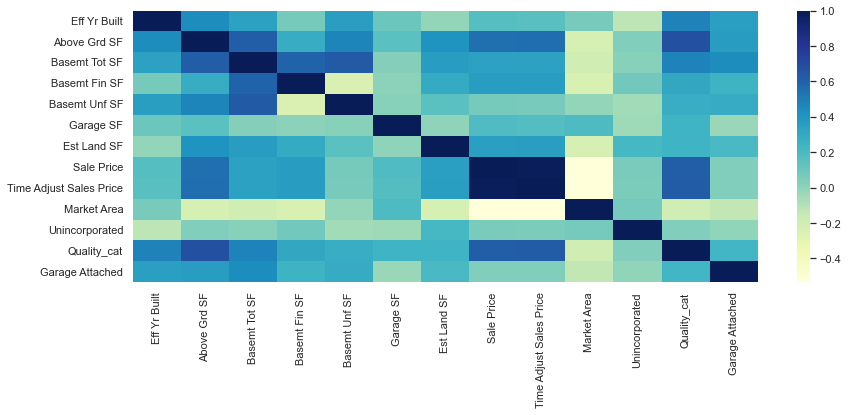

In [70]:
# calculate the correlation matrix
corr = quant.corr()
# plot the heatmap
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns, cmap="YlGnBu")

I would like to see how the unincorporated properties are distributed between market areas. 

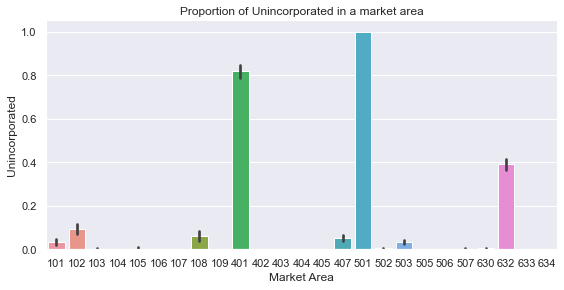

In [71]:
sns.catplot(
    data=X, x="Market Area", y="Unincorporated", 
    kind="bar", height=4, aspect=2,
)
plt.title("Proportion of Unincorporated in a market area")
plt.show()


All of Niwot (501) is unincorporated as well as most of Gunbarrel (401).

Text(0.5, 1.0, 'Quality distribution of each Market Area')

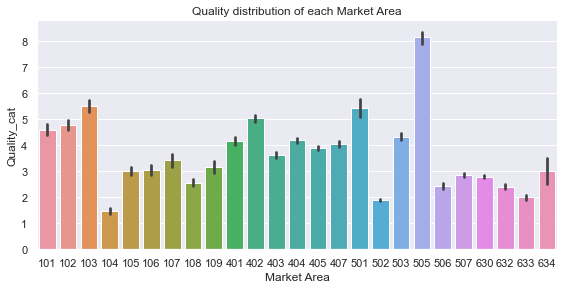

In [72]:
sns.catplot(
    data=X, x="Market Area", y="Quality_cat", 
    kind="bar", height=4, aspect=2,
)
plt.title("Quality distribution of each Market Area")

It look like all the unincorporated properties are in Gunbarrel and none in other Market Areas.

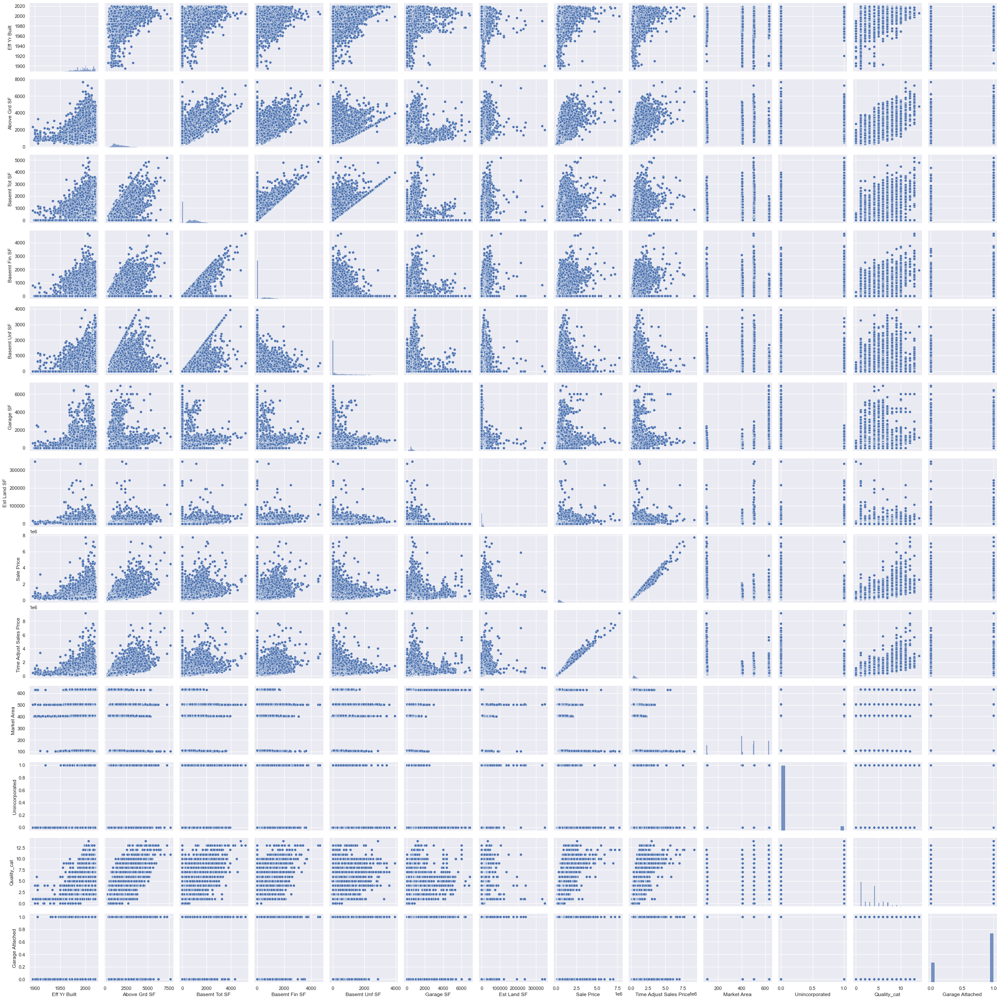

In [73]:
quant_no_dummies =X[['Eff Yr Built', 'Above Grd SF',
       'Basemt Tot SF', 'Basemt Fin SF', 'Basemt Unf SF', 
       'Garage SF', 'Est Land SF',  
       'Sale Price', 'Time Adjust Sales Price', 'Market Area',
       'Unincorporated', 'Quality_cat', 'Garage Attached']]
sns.pairplot(quant_no_dummies)
plt.show()

<AxesSubplot:>

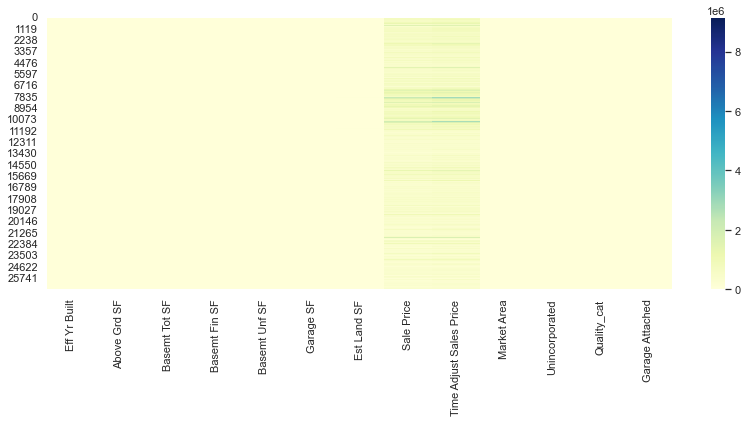

In [74]:
sns.heatmap(quant,cmap="YlGnBu")

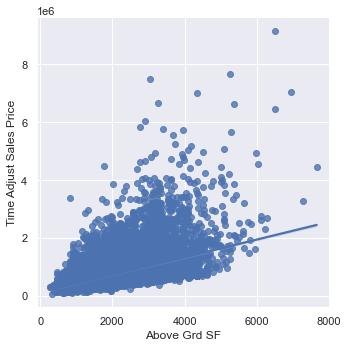

In [75]:
sns.lmplot(data=X, x="Above Grd SF", y="Time Adjust Sales Price")

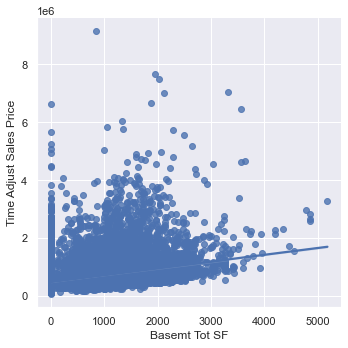

In [76]:
sns.lmplot(data=X, x="Basemt Tot SF", y="Time Adjust Sales Price")

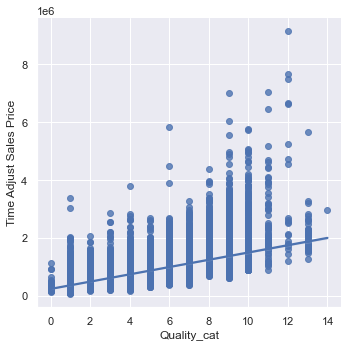

In [77]:
sns.lmplot(data=X, x="Quality_cat", y="Time Adjust Sales Price")

In [78]:
corr[corr>0.5]


,Eff Yr Built,Above Grd SF,Basemt Tot SF,Basemt Fin SF,Basemt Unf SF,Garage SF,Est Land SF,Sale Price,Time Adjust Sales Price,Market Area,Unincorporated,Quality_cat,Garage Attached
Eff Yr Built,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Above Grd SF,NaN,1.000000,0.614816,NaN,NaN,NaN,NaN,0.548889,0.550469,NaN,NaN,0.680401,NaN
Basemt Tot SF,NaN,0.614816,1.000000,0.59703,0.633722,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Basemt Fin SF,NaN,NaN,0.597030,1.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Basemt Unf SF,NaN,NaN,0.633722,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Garage SF,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Est Land SF,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
Sale Price,NaN,0.548889,NaN,NaN,NaN,NaN,NaN,1.000000,0.985861,NaN,NaN,0.622047,NaN
Time Adjust Sales Price,NaN,0.550469,NaN,NaN,NaN,NaN,NaN,0.985861,1.000000,NaN,NaN,0.626828,NaN
Market Area,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN


In [79]:
quantitative =['Eff Yr Built', 'Above Grd SF',
       'Basemt Tot SF', 'Basemt Fin SF', 'Basemt Unf SF', 
       'Garage SF', 'Est Land SF',  
       'Sale Price', 'Time Adjust Sales Price', 'Market Area',
       'Unincorporated', 'Design_1 Sty Townh', 'Design_Bi Level',
       'Design_Modular', 'Design_Multi Sty', 'Design_Paired', 'Design_Ranch',
       'Design_Split level', 'Quality_cat', 'Garage Attached',
       'Market Area_401', 'Market Area_402', 'Market Area_403',
       'Market Area_404', 'Market Area_405']

In [81]:
X['Property Type orig']= X['Property Type']
X = pd.get_dummies(X, columns=['Property Type orig'], prefix='Property Type')

In [82]:
X.columns

Index(['Accout Number', 'Property Type', 'Property Address Street Number',
       'Property Address Street Dir', 'Property Address Street Name',
       'Property Address Street Suffix', 'Property Address Unit Number',
       'Location', 'Design', 'Quality', 'Eff Yr Built', 'Above Grd SF',
       'Basemt Tot SF', 'Basemt Fin SF', 'Basemt Unf SF', 'Garage Type',
       'Garage SF', 'Est Land SF', 'Reception No', 'Sale Date (Mon-Yr)',
       'Sale Price', 'Time Adjust Sales Price', 'Market Area',
       'Unincorporated', 'Design_1 Sty Townh', 'Design_Bi Level',
       'Design_Condo', 'Design_Modular', 'Design_Multi Sty',
       'Design_Multi Sty Townh', 'Design_Paired', 'Design_Patio',
       'Design_Ranch', 'Design_Split level', 'Quality_cat', 'Garage Attached',
       'Market Area_101', 'Market Area_102', 'Market Area_103',
       'Market Area_104', 'Market Area_105', 'Market Area_106',
       'Market Area_107', 'Market Area_108', 'Market Area_109',
       'Market Area_401', 'Market Are

### Are there variables that are particularly significant in terms of explaining the answer to your project question?
The significant variables for our analysis are:  <br>
● the year the house was built <br>
● above ground square footage<br>
● Basement square footage<br>
● basement finished square footage<br>
● Garage square footage<br>
● garage type<br>
● land square footage<br>
● house design<br>
● market area <br>

● Are there significant differences between subgroups in your data that may be relevant to your project aim?

Most Market Area subgroups seem to be pretty uniform, with Gunbarrel having unincorporated properties. 

Yes Boulder is different and longmont as well, condos and townhomes are different as well. 400,500,100 and 200 and 300s together. Those are the subgroups. 

● Are there strong correlations between pairs of independent variables or between an independent and a dependent variable?<br>

There are strong correlations between time adjusted sale price and sale price, so keep time adjusted sale price only. Market area 401 and unincorporated is 0.83687. Most unincorporated properties are located in Gunbarrel and some in Boulder. <br>


There is a significant correlation between basement total SF and Above Grd SF 0.502274. Bigger houses tend to have bigger basements.  <br>
There is a significant correlation between Garage SF and above Grd sF 0.590862. Bigger houses tend to have bigger garages. <br>
There is a significant correlation between basement unf and basement tot 0.560702. So we have some duplicated info between Basement total, Basement finished and Basement unfinished. Since Basement unfinished and Basement total are uncorrelated, we will drop the basement unfinished variable for our modeling stage. 
There is a significant correlation between quality and year built 0.507332. Older houses deteriorate more, lowering the quality.  <br>
There is a significant correlation between quality and above grd sF 0.717716. Bigger houses tend to be of better quality. If you rich, you're rich. Ok. <br>
There is a significant correlation between Quality and time adjusted sale price 0.566788, also makes sense. <br>

When we only had suburbs, we had the following correlations: 
There is a significant correlation between quality and sale price of 0.74.
There is significant correlation of 0.66 between Garage SF and Above Grd SF. 
There is significant correlation of 0.6 between Basement total and Basement unfinished. 
Correlation 0.59 between the above ground SF and sale price.
Correlation of 0.5 between garage SF and basement total SF.
Multi story design correlated with above grd SF at 0.53
Quality is correlated with Basement and Garage SF at 0.53 and 0.54. 
All of the above mentioned correlations are significant.

Looking at categorical variables, we can do chi square test by looking at quality and design or quality and market area. Testing Market Area and Quality, design and quality and Market area and Design, all pairs are not independent. 

Let's test the hypothesis that Market Area and Quality are independent. We will calculate a contingency table and perform a chi squared test. 

In [83]:
pd.crosstab(X['Market Area'], X['Quality'])

Quality,Avg,Avg +,Avg ++,Excel,Excel+,Excel++,Excep,Excep+,Fair,Good,Good +,Good ++,V Good,V Good +,V Good++
Market Area,,,,,,,,,,,,,,,
101,81,41,77,24,3,4,0,0,0,86,47,69,36,21,28
102,101,52,27,10,3,3,0,0,0,118,44,115,93,34,27
103,76,26,70,40,9,1,0,0,0,83,20,98,101,33,65
104,210,54,22,0,0,0,0,0,0,6,5,1,0,0,0
105,194,39,42,0,0,0,0,0,0,204,30,27,20,1,2
106,184,80,98,3,3,0,0,0,0,77,27,34,24,10,8
107,158,51,69,6,5,0,0,0,2,57,16,25,23,19,22
108,156,48,19,0,0,0,0,0,0,173,3,0,2,0,0
109,30,82,10,0,0,0,0,0,0,33,5,40,3,0,0


In [84]:
from scipy.stats import chi2_contingency
  
# defining the table
data = pd.crosstab(X['Market Area'], X['Quality'])
stat, p, dof, expected = chi2_contingency(data)
  
# interpret p-value
alpha = 0.05
print("p value is " + str(p))
if p <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (H0 holds true)')

p value is 0.0
Dependent (reject H0)


Now let's test the relationship between design and quality

In [85]:
# defining the table
data = pd.crosstab(X['Design'], X['Quality'])
stat, p, dof, expected = chi2_contingency(data)
  
# interpret p-value
alpha = 0.05
print("p value is " + str(p))
if p <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (H0 holds true)')

p value is 0.0
Dependent (reject H0)


Now let's test the relationship between design and Market Area

In [86]:
# defining the table
data = pd.crosstab(X['Market Area'], X['Design'])
stat, p, dof, expected = chi2_contingency(data)
  
# interpret p-value
alpha = 0.05
print("p value is " + str(p))
if p <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (H0 holds true)')

p value is 0.0
Dependent (reject H0)


For quantitative variables we'll use pearson's r

In [87]:
from scipy.stats.stats import pearsonr

#calculation correlation coefficient and p-value between x and y
pearsonr(X['Quality_cat'], X['Time Adjust Sales Price'])


(0.6268279642306734, 0.0)

And since the corresponding p-value is less than .05, we conclude that there is a statistically significant association between the two variables.

In [88]:
pearsonr(X['Garage SF'], X['Above Grd SF'])

(0.14886749790288115, 8.762598320170491e-133)

In [89]:
pearsonr(X['Basemt Tot SF'],X['Basemt Unf SF'])

(0.6337222664485201, 0.0)

In [90]:
pearsonr(X['Basemt Tot SF'], X['Garage SF'])

(0.025233026780445145, 3.567634655318976e-05)

In [91]:
pearsonr(X['Basemt Tot SF'], X['Quality_cat'])

(0.4749631457124185, 0.0)

In [92]:
pearsonr(X['Quality_cat'], X['Garage SF'])

(0.24130499685044043, 0.0)

In [93]:
X.columns

Index(['Accout Number', 'Property Type', 'Property Address Street Number',
       'Property Address Street Dir', 'Property Address Street Name',
       'Property Address Street Suffix', 'Property Address Unit Number',
       'Location', 'Design', 'Quality', 'Eff Yr Built', 'Above Grd SF',
       'Basemt Tot SF', 'Basemt Fin SF', 'Basemt Unf SF', 'Garage Type',
       'Garage SF', 'Est Land SF', 'Reception No', 'Sale Date (Mon-Yr)',
       'Sale Price', 'Time Adjust Sales Price', 'Market Area',
       'Unincorporated', 'Design_1 Sty Townh', 'Design_Bi Level',
       'Design_Condo', 'Design_Modular', 'Design_Multi Sty',
       'Design_Multi Sty Townh', 'Design_Paired', 'Design_Patio',
       'Design_Ranch', 'Design_Split level', 'Quality_cat', 'Garage Attached',
       'Market Area_101', 'Market Area_102', 'Market Area_103',
       'Market Area_104', 'Market Area_105', 'Market Area_106',
       'Market Area_107', 'Market Area_108', 'Market Area_109',
       'Market Area_401', 'Market Are

So now it's time to save our X and Y variables ready for analysis. We keep the time adjusted sales price and drop the unfinished basement variable. 

In [94]:
data_for_modeling = X[['Eff Yr Built', 'Above Grd SF',
       'Basemt Fin SF', 'Basemt Unf SF',
       'Garage SF', 'Est Land SF',  
       'Unincorporated', 'Quality_cat', 'Garage Attached',
       'Design_1 Sty Townh', 'Design_Bi Level',
       'Design_Condo', 'Design_Modular', 'Design_Multi Sty',
       'Design_Multi Sty Townh', 'Design_Paired', 'Design_Patio',
       'Design_Ranch', 'Design_Split level',
       'Market Area_101', 'Market Area_102', 'Market Area_103',
       'Market Area_104', 'Market Area_105', 'Market Area_106',
       'Market Area_107', 'Market Area_108', 'Market Area_109',
       'Market Area_401', 'Market Area_402', 'Market Area_403',
       'Market Area_404', 'Market Area_405', 'Market Area_407',
       'Market Area_501', 'Market Area_502', 'Market Area_503',
       'Market Area_505', 'Market Area_506', 'Market Area_507',
       'Market Area_630', 'Market Area_632', 'Market Area_633',
       'Market Area_634','Time Adjust Sales Price','Property Type_DUP_TRI', 'Property Type_RCON',
       'Property Type_SFR', 'Property Type_TWNHM']]

In [95]:
data_for_modeling.to_csv('data/data_for_modeling.csv', index=False)